# 숙명여자대학교 기계시스템학부 딥러닝 2024: Lab7

## Topic: **Depth Estimation**
## (강사: 심주용)


## Load Depth & Color Data

Dataset:
https://drive.google.com/file/d/1p4v0_saSAzpiXGZFygXBgnHfILwSWzlO/view?usp=sharing

## Define Dataset

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

path = '/content/drive/MyDrive/2024_DL/resized_images'

class DepthDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.depth_files = [f for f in os.listdir(root_dir) if f.endswith('.depth.exr.tiff')]
        self.rgb_files = [f for f in os.listdir(root_dir) if f.endswith('.png')]

    def __len__(self):
        return len(self.depth_files)

    def __getitem__(self, idx):
        depth_path = os.path.join(self.root_dir, self.depth_files[idx])
        rgb_path = os.path.join(self.root_dir, self.rgb_files[idx])

        depth_image = Image.open(depth_path)
        rgb_image = Image.open(rgb_path)

        if self.transform:
            depth_image = self.transform(depth_image)
            rgb_image = self.transform(rgb_image)

        return rgb_image, depth_image

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

dataset = DepthDataset(path, transform)


## Visualize Dataset

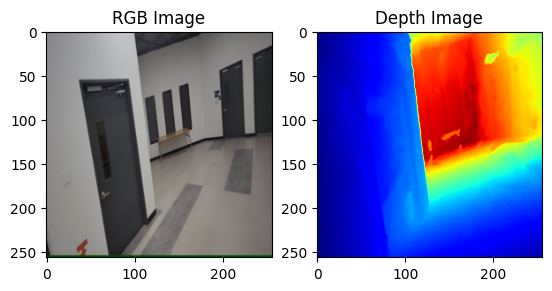

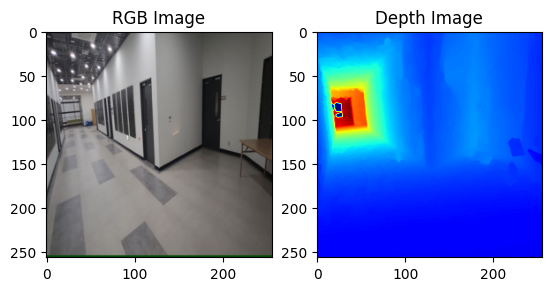

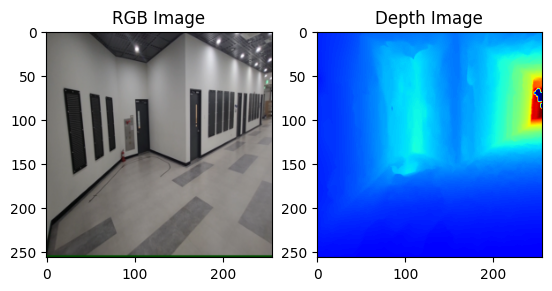

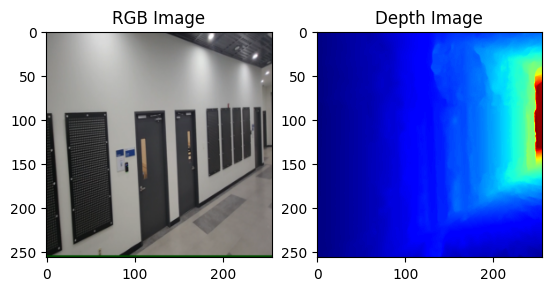

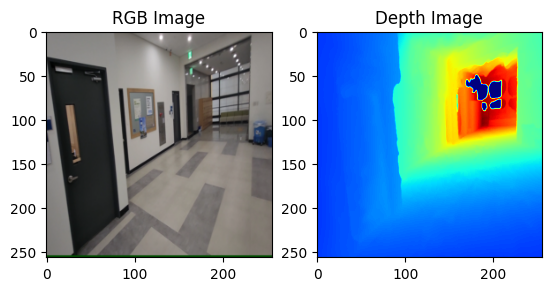

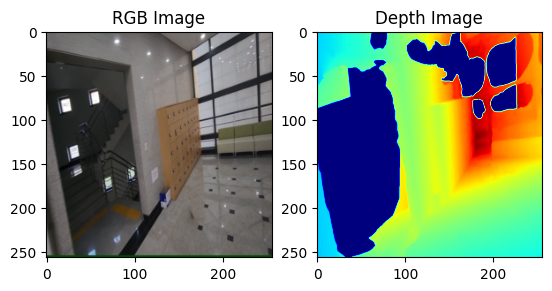

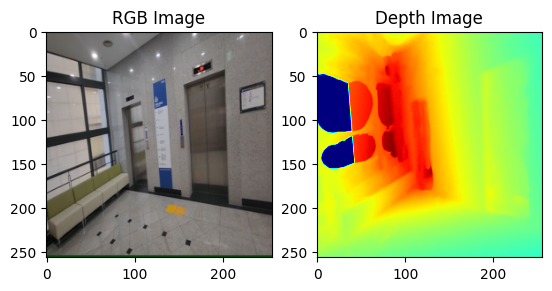

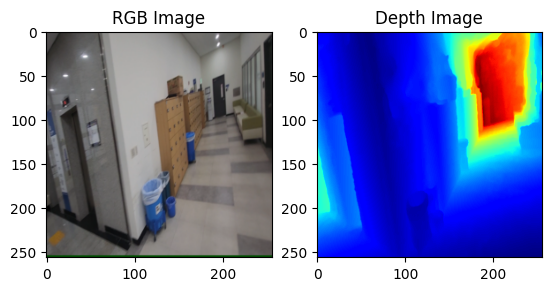

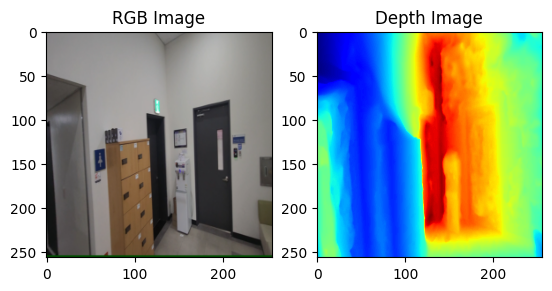

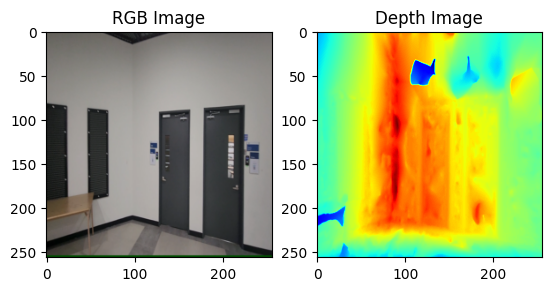

In [ ]:
# prompt: Visualize the floating point depth images and RGB images

import matplotlib.pyplot as plt

num_images = 10
for i in range(50,50+num_images*50,50):
    rgb_image, depth_image = dataset[i]

    fig, axs = plt.subplots(1, 2)
    # Create a colormap for the depth image
    cmap = plt.cm.jet

    axs[0].imshow(rgb_image.permute(1, 2, 0))
    axs[0].set_title('RGB Image')
    axs[1].imshow(depth_image.permute(1, 2, 0), cmap=cmap)
    axs[1].set_title('Depth Image')
    # plt.axis('off')
    plt.show()

## Normalize with Mean & STD

In [ ]:
loader = DataLoader(dataset, batch_size=128, shuffle=False)
mean = 0.0
std = 0.0
total_images = 0
for cnt, (rgb, depth_image) in enumerate(loader):
    #depth_image = depth_image[1]  # get the depth image
    print(cnt, '/', len(loader), 'mean', depth_image.mean(), 'std', depth_image.std())
    if cnt == len(loader)-1:
        break
    mean += depth_image.mean()
    std += depth_image.std()
    total_images += 1

mean /= total_images
std /= total_images
mean.item(), std.item()

0 / 9 mean tensor(5.4467) std tensor(3.3511)
1 / 9 mean tensor(5.8765) std tensor(3.3874)
2 / 9 mean tensor(4.4352) std tensor(2.7249)
3 / 9 mean tensor(4.9015) std tensor(2.7501)
4 / 9 mean tensor(6.1464) std tensor(4.3151)
5 / 9 mean tensor(5.4592) std tensor(3.2755)
6 / 9 mean tensor(4.6649) std tensor(2.5330)
7 / 9 mean tensor(5.3712) std tensor(3.0948)
8 / 9 mean tensor(3.9412) std tensor(0.4825)


(5.287705421447754, 3.1789941787719727)

## Normalized Dataset

In [ ]:
import os
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class DepthDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.depth_files = [f for f in os.listdir(root_dir) if f.endswith('.depth.exr.tiff')]
        self.rgb_files = [f for f in os.listdir(root_dir) if f.endswith('.png')]
        # Transform for depth images
        self.depth_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[5.288], std=[3.179])  # Normalization for depth images
        ])
        # Commonly used normalization values for RGB images
        self.rgb_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization for RGB images
        ])

    def __len__(self):
        return len(self.depth_files)

    def __getitem__(self, idx):
        depth_path = os.path.join(self.root_dir, self.depth_files[idx])
        rgb_path = os.path.join(self.root_dir, self.rgb_files[idx])

        depth_image = Image.open(depth_path)
        rgb_image = Image.open(rgb_path)

        # Apply specific transformations
        depth_image = self.depth_transform(depth_image)
        rgb_image = self.rgb_transform(rgb_image)

        return rgb_image, depth_image

# Usage example
path = '/content/drive/MyDrive/2024_DL/resized_images'
dataset = DepthDataset(path)


## Define Simple CNN Model & Train

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.conv2 = nn.Conv2d(64, 32, kernel_size=5, stride=2, padding=2)
        self.upsample = nn.Upsample(scale_factor=8, mode='bilinear', align_corners=False)  # To match the label size
        self.conv3 = nn.Conv2d(32, 1, kernel_size=5, stride=1, padding=2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = F.relu(self.conv2(x))
        x = self.upsample(x)  # Upsample to match the original image size
        x = self.conv3(x)
        return x

# Initialize model, loss, and optimizer
model = SimpleCNN()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Example training call
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Training loop
num_epochs= 30
model.train()  # Set model to training mode
for epoch in range(num_epochs):
    for i, (inputs, labels) in enumerate(dataloader):
        inputs = inputs.to(device)  # Move inputs to device (GPU or CPU)
        labels = labels.to(device)  # Move labels to device

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    lr = optimizer.param_groups[0]['lr']
    print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], Loss: {loss.item():.4f}, LR: {lr}')
    if epoch % 10 == 0:
        optimizer.param_groups[0]['lr'] = optimizer.param_groups[0]['lr']*0.5


## Visualization

### Visualize with Dataloader

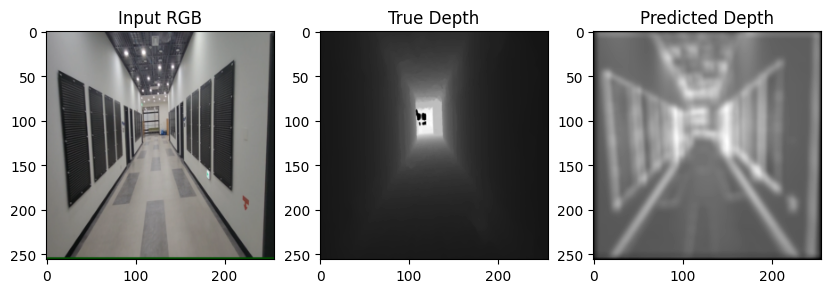

In [ ]:
# Example of using the model for prediction

model.eval()  # Set model to evaluate mode
inputs, labels = next(iter(dataloader))
inputs = inputs.to(device)  # Move inputs to device (GPU or CPU)
with torch.no_grad():
    outputs = model(inputs)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(inputs[0].cpu().permute(1, 2, 0))
    plt.title('Input RGB')
    plt.subplot(1, 3, 2)
    plt.imshow(labels[0][0], cmap='gray')
    plt.title('True Depth')
    plt.subplot(1, 3, 3)
    plt.imshow(outputs[0][0].cpu(), cmap='gray')
    plt.title('Predicted Depth')
    plt.show()

In [ ]:
import plotly.graph_objs as go
from torch.utils.data import DataLoader
import torch
import plotly.subplots as sp

# Assuming 'model' and 'dataloader' are defined elsewhere in your code

model.eval()  # Set model to evaluate mode
inputs, labels = next(iter(dataloader))
inputs = inputs.to(device)  # Move inputs to device (GPU or CPU)

with torch.no_grad():
    outputs = model(inputs)

    # Convert tensors to numpy for plotting with Plotly
    input_image = inputs[0].permute(1, 2, 0).cpu().detach().numpy()
    true_depth = labels[0][0].cpu().detach().numpy()
    predicted_depth = outputs[0][0].cpu().detach().numpy()

    # Create a figure with subplots
    # fig = go.Figure()
    fig = sp.make_subplots(rows=1, cols=3)

    # Input RGB image
    fig.add_trace(
        go.Heatmap(z=input_image[::-1,:,0], colorscale='Gray', showscale=False),
        row=1, col=1
    )

    # True depth map
    fig.add_trace(
        go.Heatmap(z=true_depth[::-1,:], colorscale='Gray', showscale=False),
        row=1, col=2
    )

    # Predicted depth map
    fig.add_trace(
        go.Heatmap(z=predicted_depth[::-1,:], colorscale='Gray', showscale=False),
        row=1, col=3
    )

    # Update layout to adjust visual aspects
    fig.update_layout(
        title_text='Input RGB and Depth Maps',
        width=900,
        height=300,
        template="plotly_white"
    )

    fig.show()

## Torch Hub Model Test

In [ ]:
!pip install timm

In [ ]:
model_type = "MiDaS_small"  # MiDaS v2.1 - Small   (lowest accuracy, highest inference speed)
midas = torch.hub.load("intel-isl/MiDaS", model_type)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
transform = midas_transforms.small_transform
transform

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning:

You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour

Downloading: "https://github.com/rwightman/gen-efficientnet-pytorch/zipball/master" to /root/.cache/torch/hub/master.zip
Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_lite3-b733e338.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_lite3-b733e338.pth
Downloading: "https://github.com/isl-org/MiD

Compose(
    <function transforms.<locals>.<lambda> at 0x7988247356c0>
    <function transforms.<locals>.<lambda> at 0x798824735750>
)

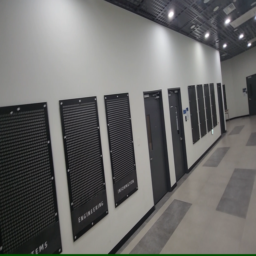

In [ ]:
path = '/content/drive/MyDrive/2024_DL/resized_images'

class DepthDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.depth_files = [f for f in os.listdir(root_dir) if f.endswith('.depth.exr.tiff')]
        self.rgb_files = [f for f in os.listdir(root_dir) if f.endswith('.png')]

    def __len__(self):
        return len(self.depth_files)

    def __getitem__(self, idx):
        depth_path = os.path.join(self.root_dir, self.depth_files[idx])
        rgb_path = os.path.join(self.root_dir, self.rgb_files[idx])

        depth_image = Image.open(depth_path)
        rgb_image = Image.open(rgb_path)

        if self.transform:
            depth_image = self.transform(depth_image)
            rgb_image = self.transform(rgb_image)

        return rgb_image, depth_image

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

dataset = DepthDataset(path)
img = dataset[0][0]
img


In [ ]:
transform = midas_transforms.small_transform
input_batch = transform(img).to(device)

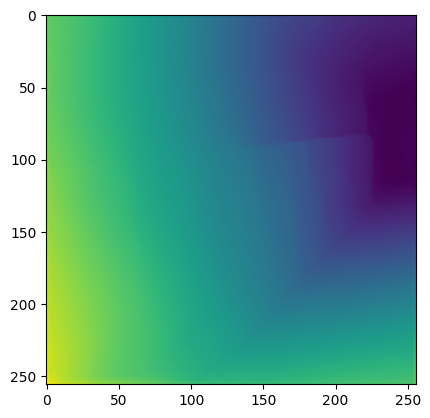

In [ ]:
with torch.no_grad():
    prediction = midas(input_batch)

    prediction = torch.nn.functional.interpolate(
        prediction.unsqueeze(1),
        size=img.shape[:2],
        mode="bicubic",
        align_corners=False,
    ).squeeze()

output = prediction.cpu().numpy()
plt.imshow(output)


In [ ]:
# prompt: plot image using plotly

import plotly.graph_objects as go

# Assuming 'output' is a numpy array containing the image data
fig = go.Figure(data=go.Heatmap(z=output[::-1,...], colorscale='Gray'))
fig.show()